In [5]:
from typing import *
import os
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
import swifter
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
from tqdm.notebook import tqdm
from nptyping import NDArray, Shape, Int, Float
from rich import print as rprint
import cv2
from knock_da import mycv


sns.set_style('whitegrid')
colors = ['#de3838', '#007bc3', '#ffd12a']
markers = ['o', 'x', ',']
%config InlineBackend.figure_formats = ['svg']

cmap = sns.diverging_palette(255, 0, as_cmap=True)  # カラーパレットの定義
DATA_DIR = Path()/'..'/'..'/'data'
DF_DIR = DATA_DIR/'dataframes'
IMG_DIR = DATA_DIR/'img'
MOV_DIR = DATA_DIR/'mov'
SNAPSHOT_DIR = DATA_DIR/'snapshot'

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

np.random.seed(1)

height: 1440, width: 1920


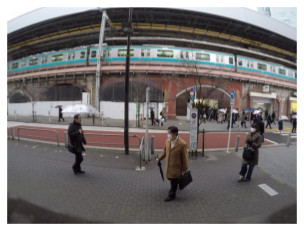

In [2]:
# 81
img = mycv.imread(IMG_DIR/'img01.jpg', verbose=True)
mycv.show_image(img)

In [4]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

cap, _, _, _, _= mycv.cap_open(mov=MOV_DIR/'mov01.avi', verbose=True)

num = 0
num_frame = 100
frames = []
while cap.isOpened():
    ret, frame = cap.read()
    if ret:
        frame_rgb = mycv.bgr2rgb(frame)
        frames.append(frame_rgb)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
        if num > num_frame:
            break
    num += 1
cap.release()

plt.figure()
patch = plt.imshow(frames[0])
plt.axis('off')
def animate(i):
    patch.set_data(frames[i])
anim = FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=1000/30.0)
plt.close()

HTML(anim.to_jshtml())

1920 x 1440 pixels, 30.0 fps, 401 frames, 13.367 s, 13 s 366 ms


In [6]:
# 83

cap, _, _, _, count= mycv.cap_open(mov=MOV_DIR/'mov01.avi', verbose=True)
num = 0
while cap.isOpened():
    ret, frame = cap.read()
    if ret:
        filepath = SNAPSHOT_DIR/f'snapshot_{num}.jpg'
        cv2.imwrite(str(filepath), frame)
    num += 1
    if num >= count:
        break

cap.release()
cv2.destroyAllWindows()

1920 x 1440 pixels, 30.0 fps, 401 frames, 13.367 s, 13 s 366 ms


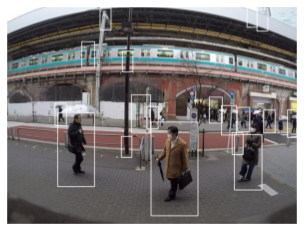

In [12]:
# 84

hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
hog_params = {
    'winStride': (8, 8),
    'padding': (32, 32),
    'scale': 1.05,
    'hitThreshold': 0,
    # 'finalThreshold': 5
    }

img = mycv.imread(IMG_DIR/'img01.jpg')
gray = mycv.bgr2gry(img)
human, r = hog.detectMultiScale(gray, **hog_params)
if len(human) > 0:
    for (x, y, w, h) in human:
        cv2.rectangle(img, (x, y), (x+w, y+h), (255, 255, 255), 3)
mycv.show_image(img)